# Chapter-02. 计算机视觉库opencv

## 【章节目标】
- 了解opencv计算机视觉库
- 掌握opencv的图像基础操纵
- 掌握opencv的绘图函数
- 掌握opencv图像几何变换
- 掌握opencv的图像滤波和增强
- 了解opencv形态学操作

## 【章节内容】
### 2.1 opencv简介
#### 2.1.1 Opencv介绍
**opencv介绍**

- OpenCV于1999年由Intel建立；
- 开源发行的跨平台计算机视觉库；
- 操作系统：Linux、Windows、Android、Mac OS；
- 构成：C 函数和少量 C++ 类；
- 接口：Python、Java、MATLAB等语言
- opencv是数字图像处理和计算机视觉领域最常见的工具包，是学习，科研，企业项目开发的好帮手。

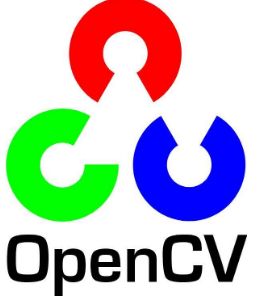

**环境安装**

- python安装
- Jupyter Notebook 安装
    - 打开命令行cmd
    - 更新pip：python -m pip install --upgrade pip
    - 安装Jupyter：pip install jupyter

- 安装Opencv-python
    - 打开命令行cmd
    - pip install opencv-contrib-python

### 2.2 图像基础操作
#### 2.2.1 图像读入、显示和保存
**读入图像**

- 函数：cv2.imread(path,flag)
- 参数说明：
    - 第一参数为待读路径；
    - 第二个参数为读取方式，常见读取方式有三种(枚举)：

    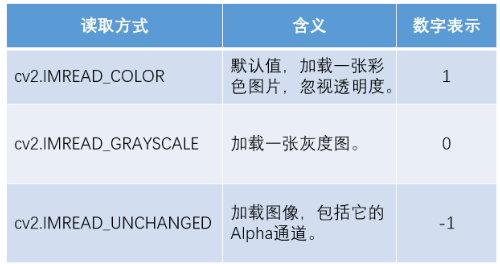

In [1]:
#导入opencv的python版本依赖库cv2
import cv2

#使用opencv中imread函数读取图片，
#0代表灰度图形式打开，1代表彩色形式打开
img = cv2.imread('Dataset/img/lena.png', 1) # 返回的是一个numpy的ndarray

print(img.shape)
print(type(img))

(512, 512, 3)
<class 'numpy.ndarray'>


**显示图像**

- 函数：cv2.imshow(title,img)
- 参数说明：
    - 参数1：窗口的名字；
    - 参数2：图像数据变量名；

In [2]:
# 调用imshow()函数进行图像显示
cv2.imshow('photo', img)

#cv2.waitKey()是一个键盘绑定函数，
#单位为毫秒，0代表等待键盘输入。
k = cv2.waitKey(0)

#cv2.destroyAllWindows() 删除窗口
#默认值为所有窗口，参数一为待删除窗口名
cv2.destroyAllWindows()

**保存图像**

- 函数：cv2.imwrite(path,img)
- 参数说明：
    - 参数1：保存的图像文件名（包括扩展名）；
    - 参数2：待写入的图像数据变量名；

In [4]:
cv2.imwrite("Dataset/img/lena.jpg", img)

True

#### 2.2.2 通道分离和合并
**通道分离**

- 函数：cv2.split(img)
- 参数说明：
    - 参数1：带分离通道的图像变量；
- 目的：
    - 将彩色图像，分成b、g、r 3个单通道图像。方便我们对BGR 三个通道分别进行操作。

In [ ]:
src = cv2.imread('Dataset/img/lena.png', 1)
cv2.imshow('before', src)
print(src.shape)
# 调用通道分离
# b,g,r=src[:,:,0],src[:,:,1],src[:,:,2]#numpy方式
b, g, r = cv2.split(src)
# 三通道分别显示
cv2.imshow('blue', b)
cv2.imshow('green', g)
cv2.imshow('red', r)
cv2.waitKey(0)
cv2.destroyAllWindows()

(512, 512, 3)


**通道合并**

- 函数：cv2.merge(List)
- 参数说明：
    - List：待合并的通道数，以list的形式输入；
- 目的：
     - 通道分离为B,G,R后，对单独通道进行修改，最后将修改后的三通道合并为彩色图像。

In [5]:
src = cv2.imread('Dataset/img/lena.png')
cv2.imshow('before', src)
# 调用通道分离
b, g, r = cv2.split(src)
# 将Blue通道数值修改为0
b[:] = 0
# 合并修改后的通道
img_merge = cv2.merge([b, g, r])
cv2.imshow('merge', img_merge)
cv2.waitKey(0)
cv2.destroyAllWindows()

#### 2.2.3 图像直方图
**图像直方图**

- 图像直方图（Image Histogram）是用以表示数字图像中亮度分布的直方图，标绘了图像中每个亮度值的像素数。这种直方图中，横坐标的左侧为纯黑、较暗的区域，而右侧为较亮、纯白的区域。
- 图像直方图的意义：
    - 直方图是图像中像素强度分布的图形表达方式。
    - 它统计了每一个强度值所具有的像素个数
    - CV 领域常借助图像直方图来实现图像的二值化

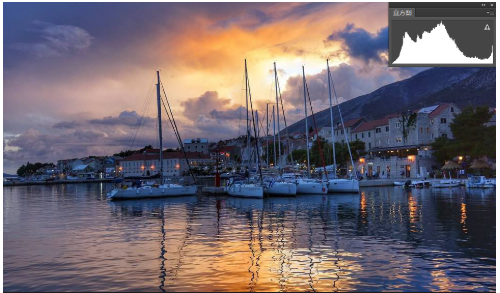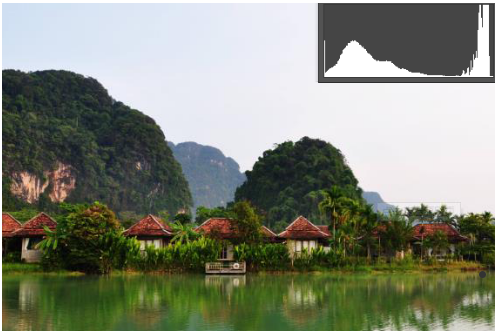

**直方图绘制**

- 函数：cv2.calcHist(images, channels, mask, histSize, ranges)
- 参数说明：
    - 参数1：待统计图像，需用中括号括起来；
    - 参数2：待计算的通道；
    - 参数3：Mask，这里没有使用，所以用None。
    - 参数4：histSize，表示直方图分成多少份；
    - 参数5：是表示直方图中各个像素的值，[0.0, 255.0]表示直方图能表示像素值从0.0到255的像素。

- 目的：
    - 直方图是对图像像素的统计分布，它统计了每个像素（0到255）的数量。

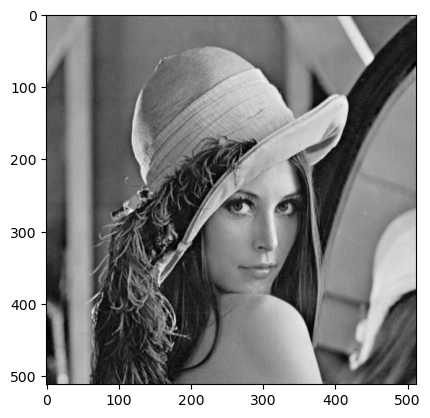

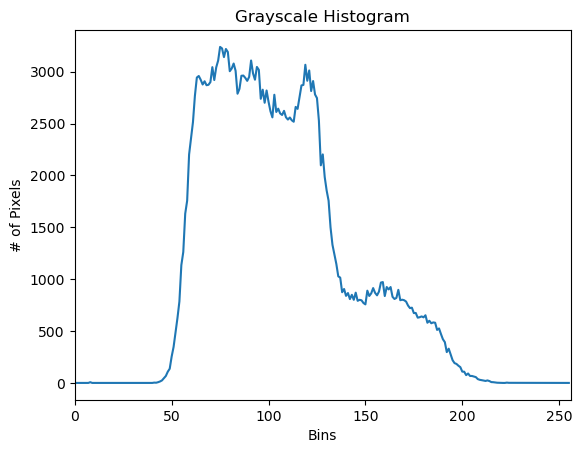

In [6]:
from matplotlib import pyplot as plt
import numpy as np
img = cv2.imread('Dataset/img/lena.png')
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.imshow(img_gray, cmap = plt.cm.gray)
hist = cv2.calcHist([img], [0], None, [256], [0, 256])

plt.figure()
plt.title("Grayscale Histogram")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
plt.plot(hist)
plt.xlim([0, 256])
plt.show()

#### 2.2.4 颜色模式转换
**颜色空间转化函数**

- 函数：cv2.cvtColor(img，flag)
- 目的：
    - 将图像在各种颜色模式（色彩空间）间进行转化。
- 参数说明：
    - 参数1：待转化图像变量名；
    - 参数2：flag就是转换模式，常用的有如下几种：

    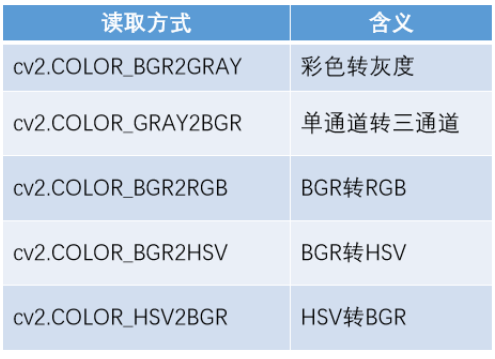

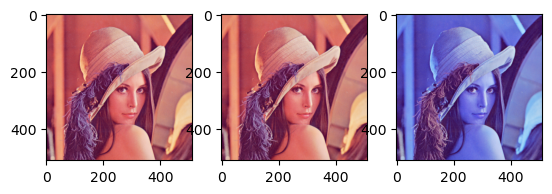

In [7]:
img = cv2.imread("Dataset/img/lena.png", cv2.IMREAD_COLOR)
# cv2.imshow("Opencv_win", img) #bgr
# 用opencv自带的方法转
img_cv_method = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# 用numpy转，img[:,:,::-1]列左右翻转
img_numpy_method = img[:, :, ::-1] # 本来是BGR 现在逆序，变成RGB
# 用matplot画图
plt.subplot(1,3,1)
plt.imshow(img_cv_method)
plt.subplot(1,3,2)
plt.imshow(img_numpy_method)
plt.subplot(1,3,3)
plt.imshow(img)
plt.show()

In [11]:
#读入原始图像，使用cv2.IMREAD_UNCHANGED
img = cv2.imread("Dataset/img/lena.png",cv2.IMREAD_UNCHANGED)
#查看打印图像的shape
shape = img.shape
print(shape) # w, h, c
#判断通道数是否为3通道或4通道
if shape[2] == 3 or shape[2] == 4:
    #判断通道数是否为3通道或4通道
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    cv2.imshow("gray_image", img_gray)
cv2.imshow("image", img)
cv2.waitKey(0)
cv2.destroyAllWindows()

(512, 512, 3)


### 2.3 绘图函数
#### 2.3.1线段绘制
- 函数：cv2.line(img，pts, color，thickness，linetype)
- 参数说明：
    - img：待绘制图像。
    - color：形状的颜色，元组如（255,0,0）。
    - pts：起点和终点
    - thickness：线条的粗细。 -1为填充，默认值是 1.
    - linetype：线条的类型，8型或cv2.LINE_AA，默认值为8型。

In [12]:
def show_img(img, title = 'example'):
    cv2.namedWindow(title)
    cv2.imshow(title, img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [ ]:
# 创建一张黑色的背景图
img = np.zeros((600, 300, 3), np.uint8)

# 绘制一条线宽为5的线段, 这里注意坐标和背景宽高对应是相反的
cv2.line(img, (0, 0), (200, 500), (0, 0, 255), 5)
show_img(img)

#### 2.3.2 矩形绘制
- 函数：cv2.rectangle(img，prets, color，thickness， linetype)
- 参数说明：
    - img：待绘制图像；
    - pts：左上角和右下角坐标点；
    - color：形状的颜色，元组如（255,0,0）；
    - thickness：线条的粗细。 -1为填充，默认值是 1；
    - linetype：线条的类型，使用默认值即可；

In [16]:
# 创建一张黑色的背景图
img = np.zeros((512,512,3), np.uint8)

# 画一个绿色边框的矩形，参数2：左上角坐标，参数3：右下角坐标
cv2.rectangle(img, (384, 0), (510, 128), (0, 255, 255), 2)
show_img(img)

#### 2.3.3 圆绘制
- 函数：cv2.circle(img，pts, radius，color，thickness， linetype)
- 参数说明：
    - img：待绘制图像。
    - pts：圆心。
    - radius：半径。
    - color：颜色。
    - thickness：线条的粗细。 -1为填充，默认值是 1。
    - linetype：线条的类型，使用默认值即可。

In [17]:
# 创建一张黑色的背景图
img = np.zeros((512,512,3), np.uint8)

# 画一个填充红色的圆，参数2：圆心坐标，参数3：半径
cv2.circle(img, (447, 63), 63, (0, 0, 255), -1)
show_img(img)

#### 2.3.4 椭圆绘制
- 函数：cv2.ellipse()
- 画椭圆需要的参数比较多，请对照后面的代码理解这几个参数：
- 参数说明：
    - 参数2：椭圆中心(x,y)
    - 参数3：x/y轴的长度
    - 参数4：angle--椭圆的旋转角度
    - 参数5：startAngle--椭圆的起始角度
    - 参数6：endAngle--椭圆的结束角度

In [19]:
# 创建一张黑色的背景图
img=np.zeros((512,512,3), np.uint8)
# 在图中心画一个填充的半圆
cv2.ellipse(img, (256, 256), (100, 50), 0, 30, 180, (255, 0, 0), -1)
show_img(img)

#### 2.3.5 多边形绘制
- 函数：
- cv2.polylines(img,pts,isClosed,color,thickness,lineType)
- 参数说明：
    - 参数1：img图像，表示你要在哪张图像上画线
    - 参数2：pts，顶点对
    - 参数3：isClosed，布尔型，True表示的是线段闭合，False表示的是仅保留线段
    - 参数4：color，线段颜色，格式是（R,G,B）值
    - 参数5：thickness, 数值型，线宽度，默认值为1，-1则会填充整个图形；
    - 参数6：lineType，线型；

In [20]:
# 创建一张黑色的背景图
img=np.zeros((512, 512, 3), np.uint8)
# 定义四个顶点坐标
pts = np.array([[20, 10],  [100,150], [400, 450], [120, 50]])
# 顶点个数：4，矩阵变成4*1*2维
pts = pts.reshape((-1, 1, 2))
print(pts)
# 绘制多边形
cv2.polylines(img, [pts], True, (0, 255, 255))
show_img(img)

[[[ 20  10]]

 [[100 150]]

 [[400 450]]

 [[120  50]]]


#### 2.3.6 添加文字
- 函数：cv2.putText()
- 同样请对照后面的代码理解这几个参数：
    - 参数2：要添加的文本
    - 参数3：文字的起始坐标（左下角为起点）
    - 参数4：字体
    - 参数5：文字大小（缩放比例）
    - 参数6：颜色
    - 参数7：线条宽度
    - 参数8：线条形状

In [21]:
# 创建一张黑色的背景图
img=np.zeros((512, 512, 3), np.uint8)
# 添加文字
font = cv2.FONT_HERSHEY_SIMPLEX
cv2.putText(img, 'OpenCV', (50, 200), font, 3, (0, 255, 255), 5)
show_img(img)

### 2.4 图像几何变换
#### 2.4.1 图像几何变换
**几何变换**

平移，旋转，缩放是严格的2D线性变换，是刚体变换（本身的形态不发生变换），剪切可以保证图中的平行线不变。2D线性变换中的变量有6个，也就是自由度DOF=6。

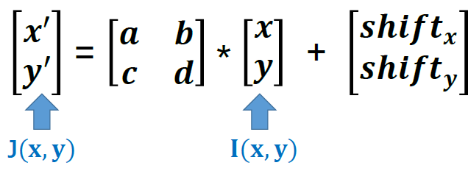

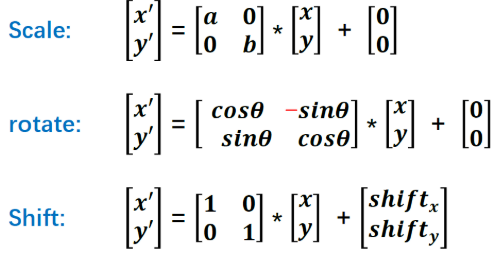

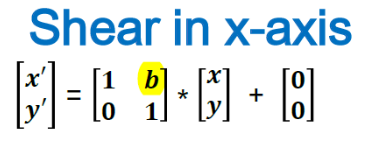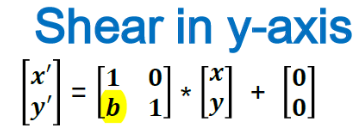

#### 2.4.2 图像平移
**图像平移**

- 将图像中所有的点按照指定的平移量水平或者垂直移动。
- 变换公式：
    - 设(x,y)为原图像上的一点，图像水平平移量为shiftx，垂直平移量为shifty，则平移后的点坐标(x',y')变为：  
    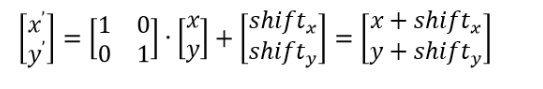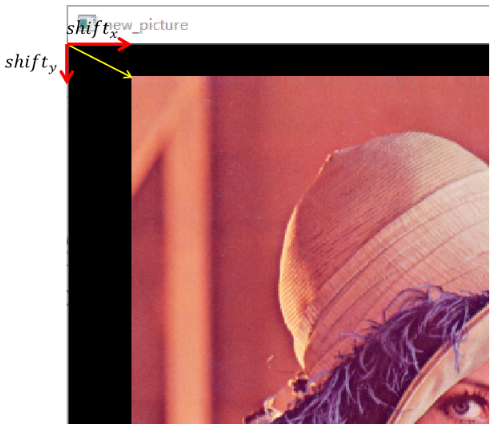

**仿射变换函数**

- 仿射变换函数：cv2.warpAffine(src, M, dsize， flags，borderMode, borderValue) 实现上述数学过程
- 其中：
    - src - 输入图像。
    - M - 变换矩阵。
    - dsize - 输出图像的大小。
    - flags - 插值方法的组合（int 类型！）
    - borderMode - 边界像素模式（int 类型！）
    - borderValue - （重点！）边界填充值; 默认情况下为0。
- 上述参数中：
    - M作为仿射变换矩阵，一般反映平移或旋转的关系，为InputArray类型的2×3的变换矩阵。
    - flags表示插值方式，默认为flags=cv2.INTER_LINEAR，表示线性插值，
    - 此外还有：
        - cv2.INTER_NEAREST（最近邻插值）
        - cv2.INTER_AREA （区域插值）
        - cv2.INTER_CUBIC（三次样条插值）
        - cv2.INTER_LANCZOS4（Lanczos插值）  
        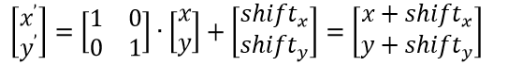

In [22]:
img = cv2.imread('Dataset/img/lena.png')
# 构造移动矩阵H
# 在x轴方向移动多少距离，在y轴方向移动多少距离
H = np.float32([[1, 0, 50], [0, 1, 25]]) # 50, 25对应上述shift，前面的0和1是单位阵
rows, cols = img.shape[:2] # h, w, c
print(img.shape)
print(rows, cols)

# 注意这里rows和cols需要反置，即先列后行
res = cv2.warpAffine(img, H, (2*cols, 2*rows))
cv2.imshow('orgin_picture', img)
cv2.imshow('new_picture', res)
cv2.waitKey(0)
cv2.destroyAllWindows()

(512, 512, 3)
512 512


#### 2.4.3 图像缩放
**上采样和下采样**

- 下采样：
    - 缩小图像称为下采样（subsampled）或降采样（downsampled）
- 上采样：
    - 放大图像称为上采样（upsampling），主要目的得到更高分辨率图像。

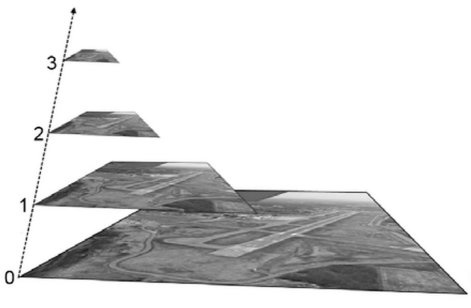

**图像缩放**

- 图像缩放：图像缩放是指图像大小按照指定的比例进行放大或者缩小。
- 函数：cv2.resize(src,dsize=None,fx,fy,interpolation)
    - scr:原图
    - dsize：输出图像尺寸，与比例因子二选一
    - fx:沿水平轴的比例因子
    - fy:沿垂直轴的比例因子
    - interpolation：插值方法

In [23]:
img = cv2.imread('Dataset/img/lena.png')
# 方法一：通过设置缩放比例，来对图像进行放大或缩小
res1 = cv2.resize(img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
height, width = img.shape[:2]
# 方法二：直接设置图像的大小，不需要缩放因子
res2 = cv2.resize(img, (int(0.8*width), int(0.8*height)), 
                  interpolation=cv2.INTER_LANCZOS4)
cv2.imshow('origin_picture', img)
cv2.imshow('res1', res1)
cv2.imshow('res2', res2)
cv2.waitKey(0)
cv2.destroyAllWindows()

#### 2.4.4 图像旋转
**图像旋转**

- 以图像的中心为原点，旋转一定的角度，也就是将图像上的所有像素都旋转一个相同的角度。旋转后图像的的大小一般会改变，即可以把转出显示区域的图像截去，或者扩大图像范围来显示所有的图像。图像的旋转变换也可以用矩阵变换来表示。
- 设点(x,y)，逆时针旋转角 θ 后的对应点为(x',y')那么，旋转后点(x',y')的坐标是：

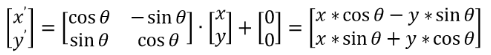

进行图像旋转时需要注意如下两点：

- （1）图像旋转之前，为了避免信息的丢失，一定要有坐标平移。
- （2）图像旋转之后，会出现许多空洞点。对这些空洞点必须进行填充处理，否则画面效果不好，一般也称这种操作为插值处理。

**图像旋转函数**

- 变换矩阵函数：cv2.getRotationMatrix2D(center, angle, scale)
- 参数：
    - center：图片的旋转中心
    - angle：旋转角度
    - scale：缩放比例，0.5表示缩小一半，正为逆时针，负值为顺时针

In [24]:
img = cv2.imread('Dataset/img/lena.png', 1)
rows, cols = img.shape[:2]
#参数1：旋转中心，参数2：旋转角度，参数3：缩放因子
#参数3正为逆时针，负值为正时针
M = cv2.getRotationMatrix2D((cols/2, rows/2), 45, 1,)
print(M)
#第三个参数是输出图像的尺寸中心
# dst=cv2.warpAffine(img,M,(cols,rows))
dst = cv2.warpAffine(img, M, (cols, rows), borderValue=(255, 255, 255))
while(1):
    cv2.imshow('img', img)
    cv2.imshow('img1', dst)
    #0xFF==27  ESC
    if cv2.waitKey(1) & 0xFF==27:
        break
cv2.destroyAllWindows()

[[   0.70710678    0.70710678 -106.03867197]
 [  -0.70710678    0.70710678  256.        ]]


#### 2.4.5 仿射变换
**仿射变换**

仿射变换的作用：

- 通过仿射变换对图片进行旋转、平移、缩放等操作以达到数据增强的效果
- 线性变换从几何直观上来看有两个要点：
    - 变换前是直线，变换后依然是直线
    - 直线的比例保持不变

    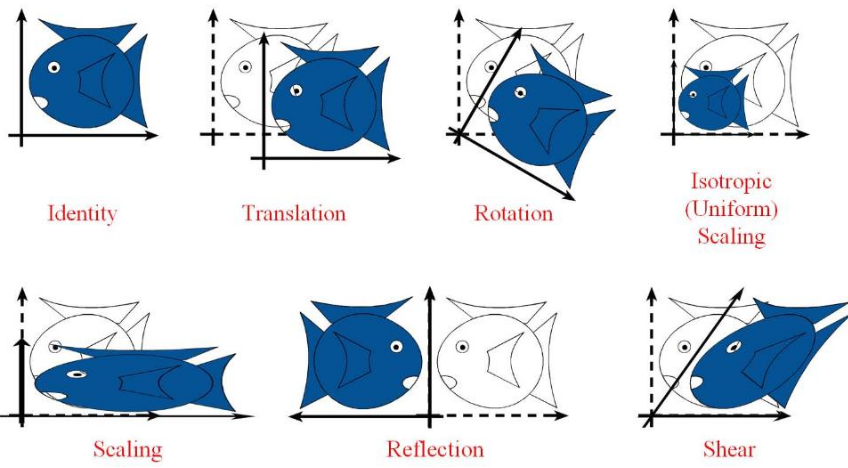

**仿射变换函数**

- 仿射变换：平移、旋转、放缩、剪切、反射
- 函数：仿射变换的函数原型：M = cv2.getAffineTransform(pos1,pos2)
    - pos1表示变换前的位置
    - pos2表示变换后的位置

In [25]:
src = cv2.imread('Dataset/img/lena.png')
# 获取图片大小
rows, cols = src.shape[:2]
# 设置图像仿射变换矩阵
pos1 = np.float32([[50, 50], [200, 50], [50, 200]]) # 三个点，六个线性方程组才能变换
pos2 = np.float32([[10, 100], [200, 50], [100, 250]])
M = cv2.getAffineTransform(pos1, pos2)
print(M)
# 图像仿射变换
result = cv2.warpAffine(src, M, (2*cols, 2*rows))
# 显示图像
cv2.imshow("original", src)
cv2.imshow("result", result)
# 等待显示
cv2.waitKey(0)
cv2.destroyAllWindows()

[[  1.26666667   0.6        -83.33333333]
 [ -0.33333333   1.          66.66666667]]


#### 2.4.6 图像插值
**图像插值方法**

- 图像几何变换带来两个问题：
    - 变换之后的像素点坐标值可能不是一个整数，而我们所使用的像素坐标值一定是整数。
    - 需要添加新的像素点
- 如何解决？
    - 插值法(近似)
    - 插值的关键思想就是保证变换后的像素点和最近的邻居最相似，最远的邻居最不相似，考虑的邻居越多，图像越光滑。一般插值方法有以下几种：

    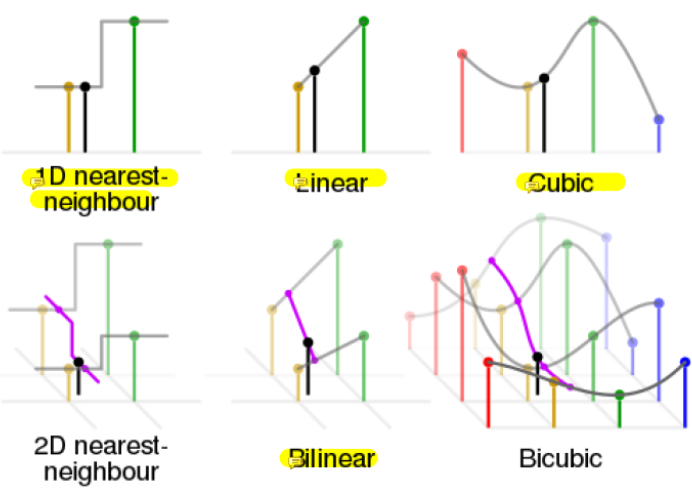

**最近邻插值**

最简单的一种插值方法，不需要计算，在待求像素的四邻像素中，将距离待求像素最近的邻像素灰度赋给待求像素。

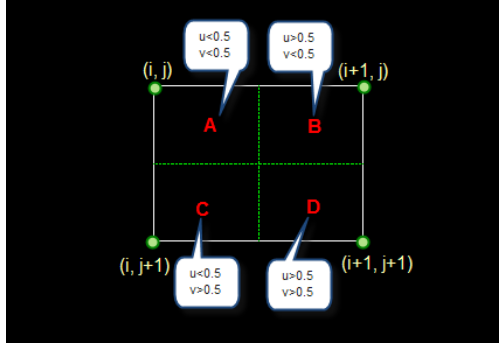

**双线性插值**

- 双线性插值使用了4个相邻的点，假设为a, b, c, d
- 双线性插值又叫一阶插值法，它要经过三次插值才能获得最终结果，是对最近邻插值法的一种改进，先对两水平方向进行一阶线性插值，然后再在垂直方向上进行一阶线性插值。

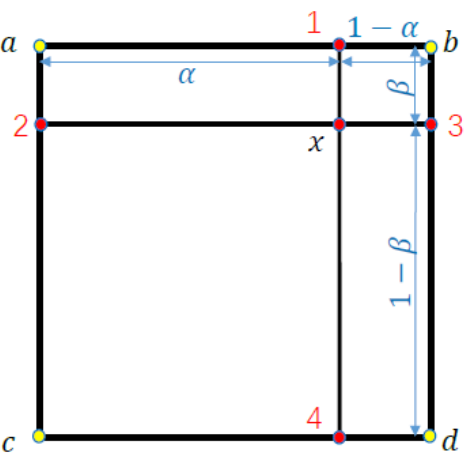  
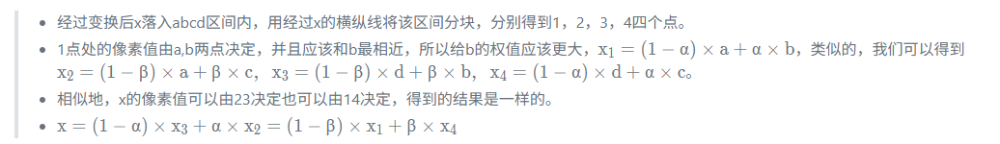


### 2.5 图像滤波和增强
#### 2.5.1 图像滤波简介
**图像滤波简介**

- 滤波实际上是信号处理得一个概念，图像可以看成一个二维信号，其中像素点的灰度值代表信号的强弱；
    - 高频：图像上变化剧烈的部分；
    - 低频：图像灰度值变化缓慢，平坦的地方；
- 根据图像高低频，设置高通和低通滤波器。高通滤波器可以检测变化尖锐，明显的地方，低通可以让图像变得平滑，消除噪声；
- 滤波作用：高通滤波器用于边缘检测，低通滤波器用于图像平滑去噪；
- 线性滤波：方框滤波/均值滤波/高斯滤波；
- 非线性滤波：中值滤波/双边滤波；

**图像滤波简介**

- 频域算子：利用给定像素周围的像素值决定此像素的最终输出值的一种算子；
- 线性滤波:一种常用的频域算子，像素输出取决于输入像素的加权和：

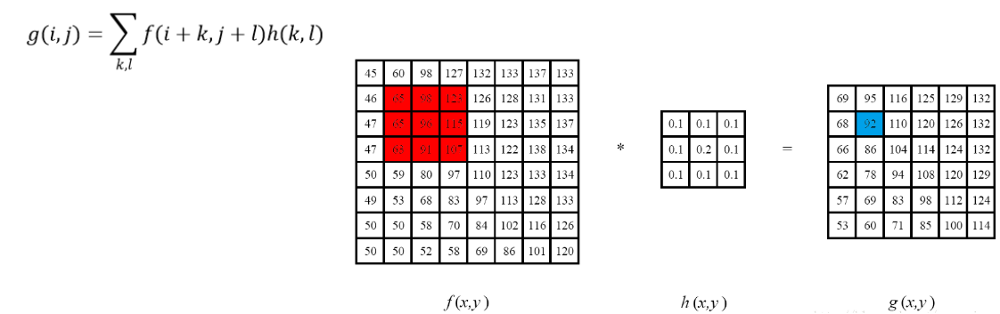

#### 2.5.2 线性滤波
**方框滤波**

- 方框滤波（box Filter）被封装在一个名为boxFilter的函数中，即boxFilter
- 函数的作用是使用方框滤波器（box filter）来模糊一张图片；

- 方框滤波核：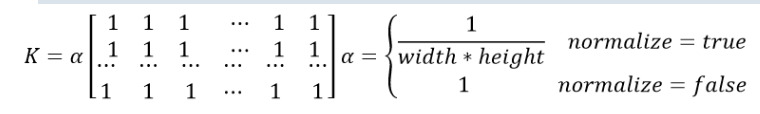
    > normalize = true与均值滤波相同  
    > normalize = false很容易发出溢出

**方框滤波函数**

- 函数：cv2.boxFilter(src,depth，ksize，normalize)
- 参数说明：
    - 参数1：输入图像
    - 参数2：目标图像深度
    - 参数3：核大小
    - 参数4：normalize属性

In [26]:
img = cv2.imread('Dataset/img/lena.png', cv2.IMREAD_UNCHANGED)
r = cv2.boxFilter(img, -1, (7, 7), normalize = 1)
d = cv2.boxFilter(img, -1, (3, 3), normalize = 0)
cv2.namedWindow('img', cv2.WINDOW_AUTOSIZE)
cv2.namedWindow('r', cv2.WINDOW_AUTOSIZE)
cv2.namedWindow('d', cv2.WINDOW_AUTOSIZE)
cv2.imshow('img', img)
cv2.imshow('r', r)
cv2.imshow('d', d)
cv2.waitKey(0)
cv2.destroyAllWindows()

**均值滤波**

均值滤波器是最简单的一种图像滤波方法，可以滤除均匀噪声和高斯噪声，但是会对图像造成一定程度的模糊。

- 对左图中左上角的9个点进行均值滤波，得到右图中左上角9个点的中心值3的计算过程为：

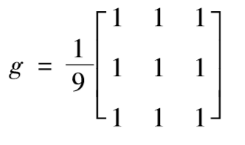

- 依次滑动这个滤波器，即可得到图3-6中右图所示阴影区域中的结果。

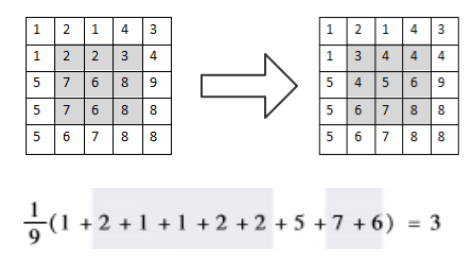

**均值滤波函数**

- 函数：cv2.blur(src, ksize)
- 参数说明：
    - 参数1：输入原图
    - 参数2：kernel的大小，一般为奇数

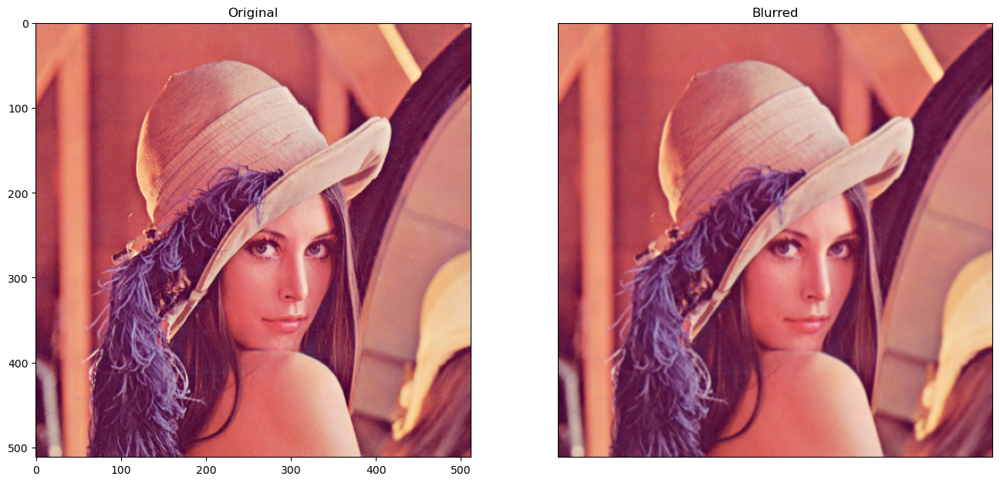

In [ ]:
img = cv2.imread('Dataset/img/lena.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
blur = cv2.blur(img, (3, 3))
plt.figure(figsize=(16, 9))
plt.subplot(121), plt.imshow(img), plt.title('Original')
plt.subplot(122), plt.imshow(blur), plt.title('Blurred')
plt.xticks([]), plt.yticks([])
plt.show()

**高斯滤波**

高斯滤波器是一种线性滤波器，能够有效的抑制噪声，平滑图像。其作用原理和均值滤波器类似。其窗口模板的系数和均值滤波器不同。

- 均值滤波器的模板系数都是相同的为1；
- 高斯滤波器的模板系数，则随着距离模板中心的增大而系数减小。
- 高斯滤波器相比于均值滤波器对图像的模糊程度较小。

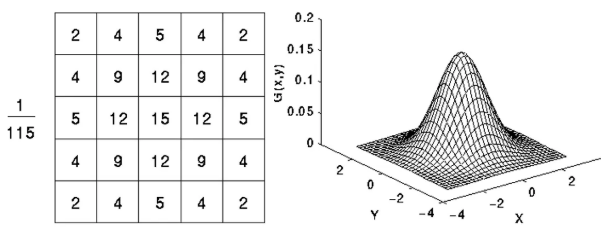

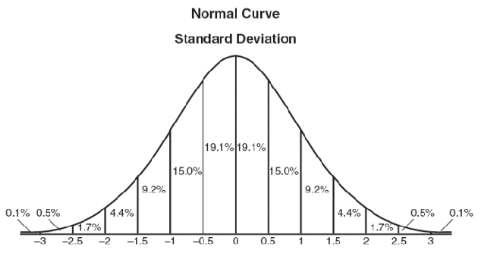

高斯滤波器模板系数，中间大，边缘小
**高斯滤波函数**

- 函数：cv2.Guassianblur(src, ksize, std)
- 表示进行高斯滤波，
- 参数说明:
    - 参数1：输入原图
    - 参数2：高斯核大小
    - 参数3：标准差σ，平滑时，调整σ实际是在调整周围像素对当前像素的影响程度，调大σ即提高了远处像素对中心像素的影响程度，滤波结果也就越平滑。

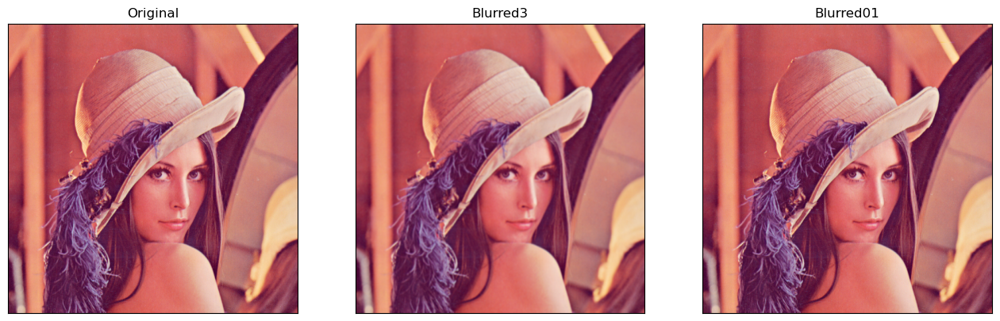

In [28]:
img = cv2.imread('Dataset/img/lena.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
blur3 = cv2.GaussianBlur(img, (3, 3), 3)
blur01 = cv2.GaussianBlur(img, (3, 3), 0.1)
plt.figure(figsize=(16,9))
plt.subplot(131),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(blur3),plt.title('Blurred3')
plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(blur01),plt.title('Blurred01')
plt.xticks([]), plt.yticks([])
plt.show()

#### 2.5.3 非线性滤波
**中值滤波**

- 中值滤波是一种非线性滤波，是用像素点邻域灰度值的中指代替该点的灰度值，中值滤波可以去除椒盐噪声和斑点噪声相比于均值滤波，中值滤波可以有效减少图片的模糊程度。
- 均值受异常值影响，而中位数不受其影响（数据中位数在绝大多数情况下都是图像中正常的信息而不是噪声）

中值滤波和均值滤波原理比较

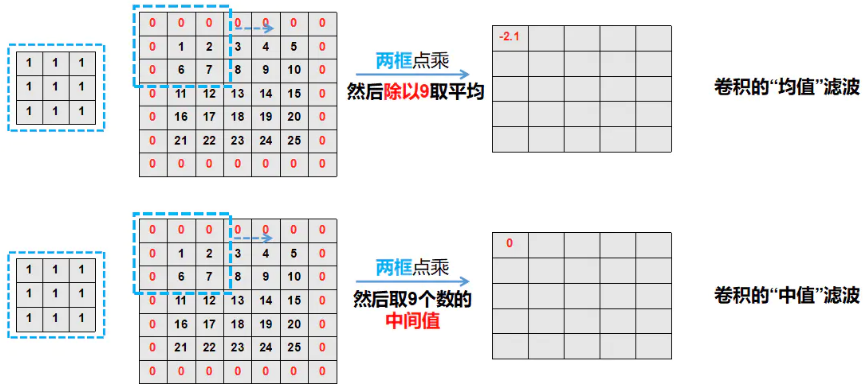

**中值滤波函数**

- 函数：cv2.medianBlur(img,ksize)
- 参数说明:
    - 参数1：输入原图
    - 参数2：核大小

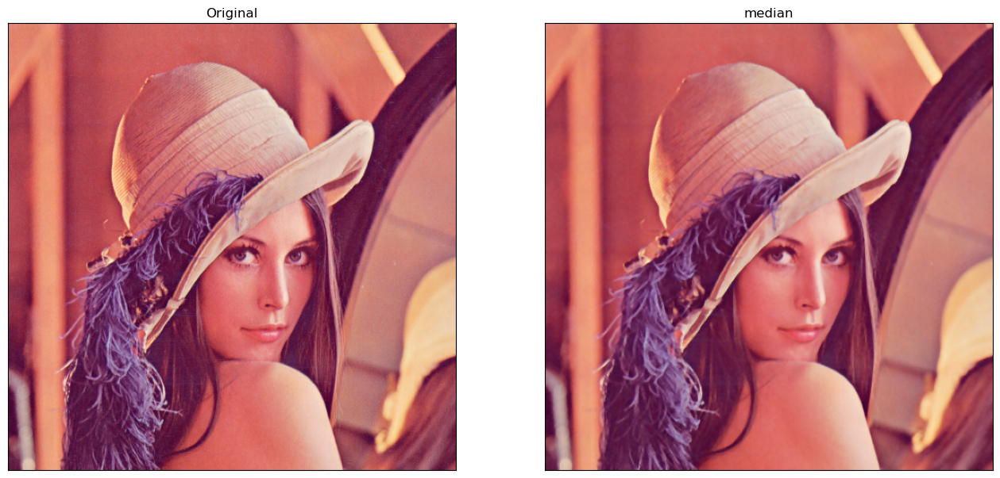

In [29]:
img = cv2.imread('Dataset/img/lena.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
median = cv2.medianBlur(img, 3)

plt.figure(figsize=(16,9))
plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(median),plt.title('median')
plt.xticks([]), plt.yticks([])
plt.show()

**均值滤波，高斯滤波和中值滤波对比**  
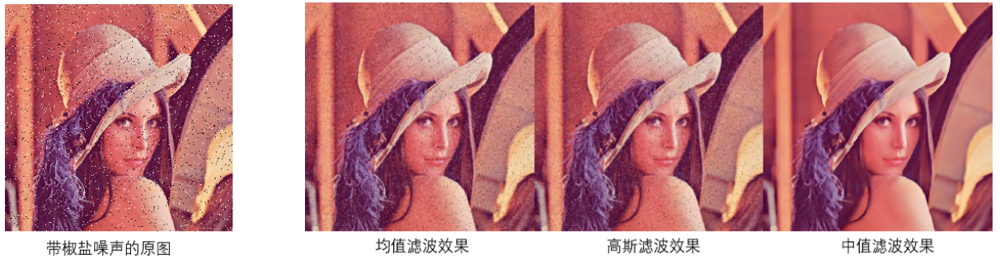

#### 2.5.4 直方图均衡化
**直方图回顾**

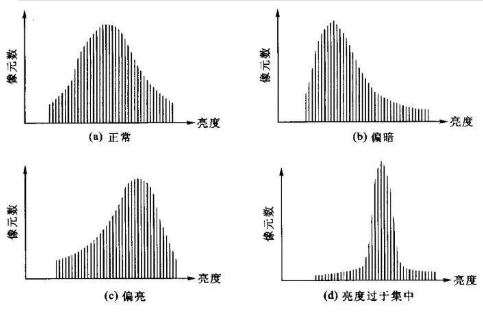

**直方图均衡化**

- 目的
    - 直方图均衡化是将原图像通过某种变换，得到一幅灰度直方图为均匀分布的新图像的方法。
    - 直方图均衡化方法的基本思想是对在图像中像素个数多的灰度级进行展宽，而对像素个数少的灰度级进行缩减。从而达到清晰图像的目的。
- 函数：cv2.equalizeHist（img）
    - 参数1：待均衡化图像
- 步骤
    - 统计直方图中每个灰度级出现的次数；
    - 计算累计归一化直方图；
    - 重新计算像素点的像素值

    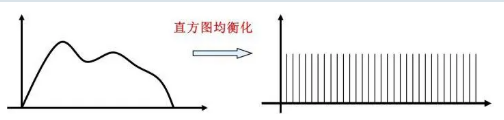

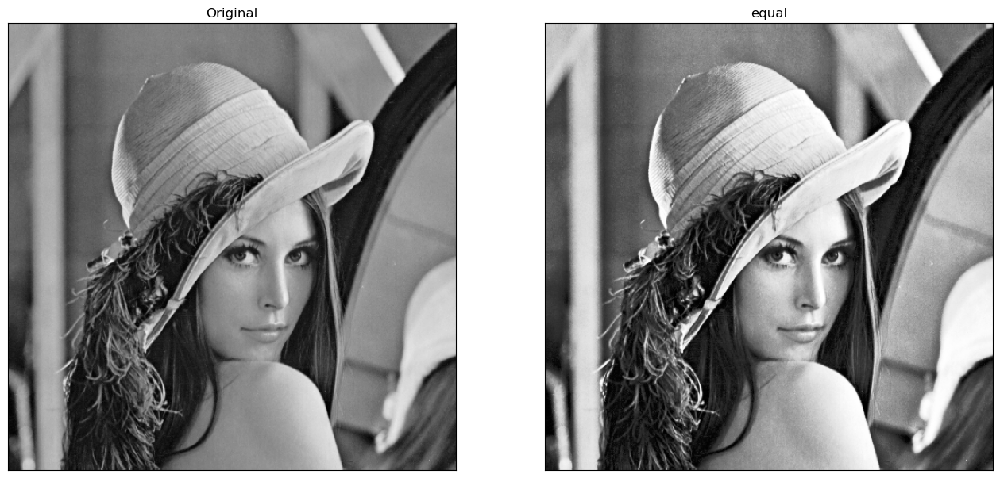

In [31]:
# 直接读为灰度图像
img = cv2.imread('Dataset/img/lena.png', 0)
# 调用cv2.equalizeHist函数进行直方图均衡化
img_equal = cv2.equalizeHist(img)

plt.figure(figsize=(16,9))
plt.subplot(121),plt.imshow(img,cmap="gray"),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(img_equal,cmap="gray"),plt.title('equal')
plt.xticks([]), plt.yticks([])
plt.show()

**彩色图像均衡化**

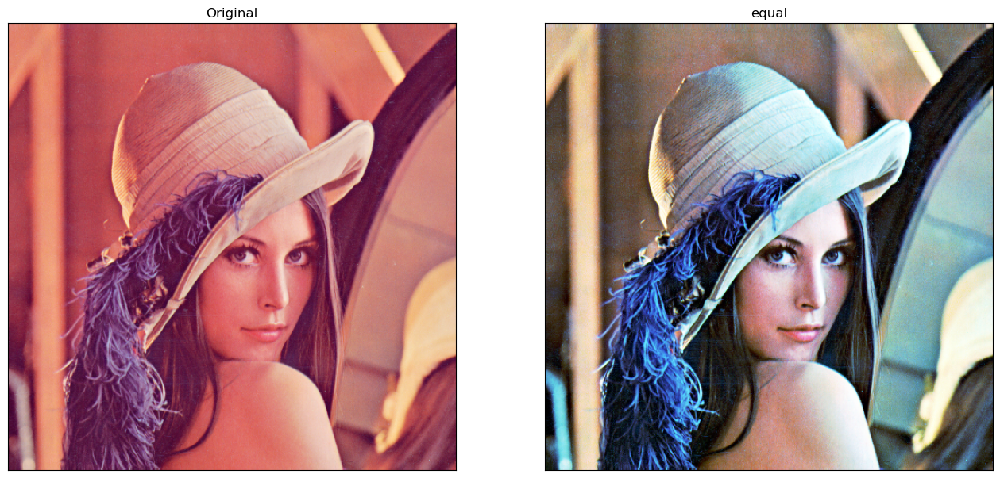

In [32]:
img = cv2.imread('Dataset/img/lena.png')
# 彩色图像均衡化,需要分解通道 对每一个通道均衡化
(b, g, r) = cv2.split(img)
bH = cv2.equalizeHist(b)
gH = cv2.equalizeHist(g)
rH = cv2.equalizeHist(r)
# 合并每一个通道
result = cv2.merge((bH, gH, rH))
plt.figure(figsize=(16, 9))
plt.subplot(121), plt.imshow(img[:,:,::-1]), plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(result[:,:,::-1]), plt.title('equal')
plt.xticks([]), plt.yticks([])
plt.show()

#### 2.5.5 Gamma变换
**Gamma变换**

- 经过Gamma变换后的输入和输出图像灰度值关系如图所示：横坐标是输入灰度值，纵坐标是输出灰度值，蓝色曲线是gamma值小于1时的输入输出关系，红色曲线是gamma值大于1时的输入输出关系。可以观察到，当gamma值小于1时(蓝色曲线)，图像的整体亮度值得到提升，同时低灰度处的对比度得到增加，更利于分辩低灰度值时的图像细节。

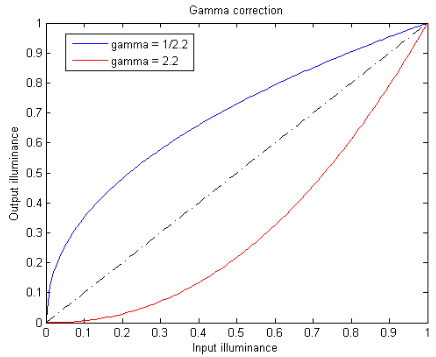

> gamma>1, 较亮的区域灰度被拉伸，较暗的区域灰度被压缩的更暗，图像整体变暗；  
> gamma<1, 较亮的区域灰度被压缩，较暗的区域灰度被拉伸的较亮，图像整体变亮；

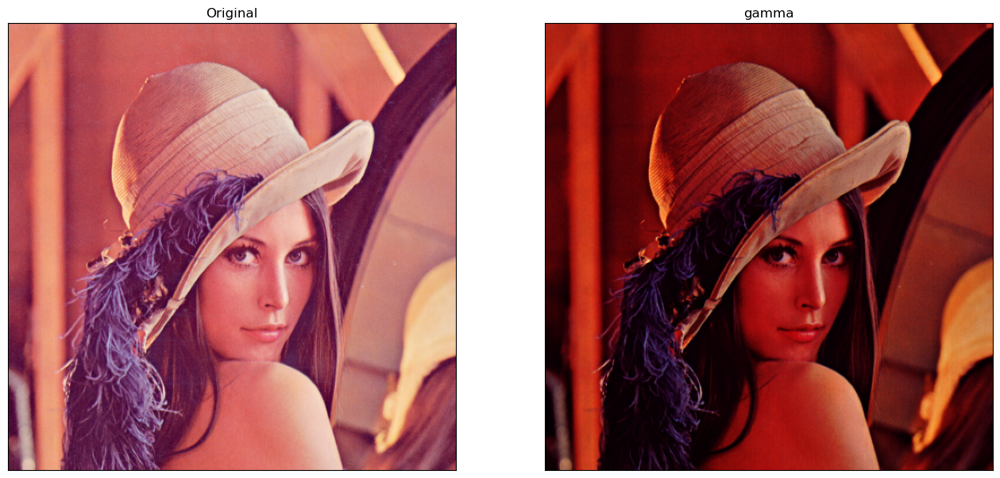

In [36]:
import numpy as np
img = cv2.imread('Dataset/img/lena.png')
def adjust_gamma(image, gamma = 1.0):
    invGamma = gamma
    table = []
    for i in range(256):
        table.append(((i / 255.0) ** invGamma) * 255) # 灰度计算
    table = np.array(table).astype("uint8")
    return cv2.LUT(image, table) # 灰度映射

img_gamma = adjust_gamma(img, 3)
plt.figure(figsize=(16, 9))
plt.subplot(121), plt.imshow(img[:,:,::-1]), plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img_gamma[:,:,::-1]), plt.title('gamma')
plt.xticks([]), plt.yticks([])
plt.show()

### 2.6 形态学操作
#### 2.6.1 形态学概述
- 形态学，是图像处理中应用最为广泛的技术之一，主要用于从图像中提取对表达和描绘区域形状有意义的图像分量，使后续的识别工作能够抓住目标对象最为本质的形状特征，如边界和连通区域等。
- 结构元素：
- 设有两幅图像B，X。 若X是被处理的对象，而B是用来处理X的，则称B为结构元素(structure element)，又被形象地称做刷子(卷积核)。
- 结构元素通常都是一些比较小的图像

#### 2.6.2 腐蚀和膨胀
**膨胀和腐蚀**

图像的膨胀（Dilation）和腐蚀（Erosion）是两种基本的形态学运算，其中膨胀类似于“领域扩张”，将图像中的白色部分进行扩张，其运行结果图比原图的白色区域更大；腐蚀类似于“领域被蚕食”，将图像中白色部分进行缩减细化，其运行结果图比原图的白色区域更小。

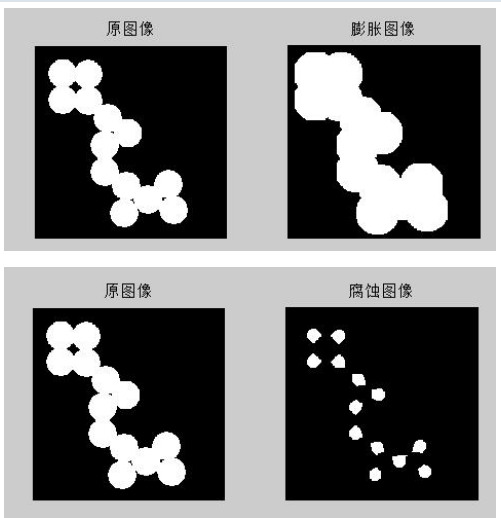

**图像腐蚀**

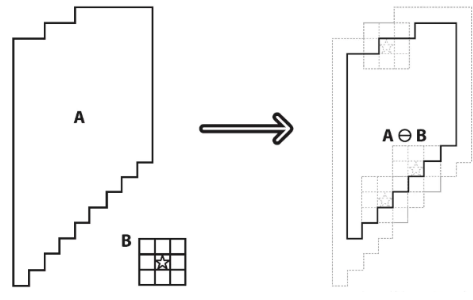

- 把结构元素B平移a后得到Ba，若Ba包含于X，我们记下这个a点，所有满足上述条件的a点组成的集合称做X被B腐蚀(Erosion)的结果。如右图所示。
- 其中X是被处理的对象，B是结构元素。对于任意一个在阴影部分的点a，Ba 包含于X，所以X被B腐蚀的结果就是那个阴影部分。阴影部分在X的范围之内，且比X小，就象X被剥掉了一层似的。

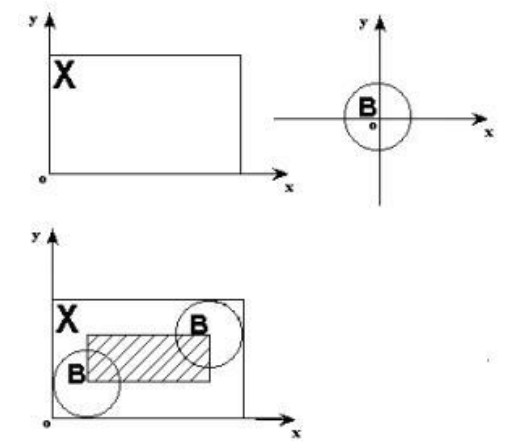

- 函数：cv2.erode（src,element,anchor,iterations）
    - 参数1：src，原图像
    - 参数2：element，腐蚀操作的内核，默认为一个简单的 3x3 矩
    - 参数3：anchor，默认为Point(-1,-1),内核中心点
    - 参数4：iterations，腐蚀次数,默认值1

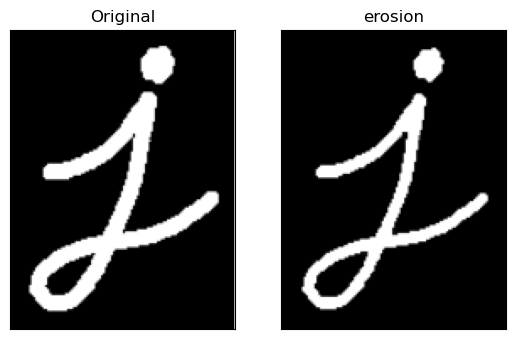

In [38]:
img = cv2.imread('Dataset/img/morphology.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
kernel = np.ones((3, 3), np.uint8) # 核
erosion = cv2.erode(img, kernel, iterations = 1) # 腐蚀
plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(erosion),plt.title('erosion')
plt.xticks([]), plt.yticks([])
plt.show()

[[0 0 0 1 0 0 0]
 [0 1 1 1 1 1 0]
 [1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1]
 [0 1 1 1 1 1 0]
 [0 0 0 1 0 0 0]]


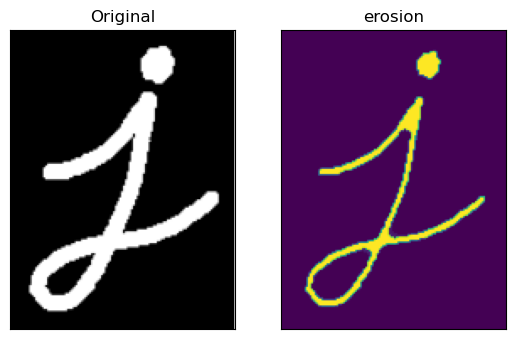

: 

In [ ]:
img = cv2.imread('Dataset/img/morphology.png')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2.imshow("Gray Image", gray)

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
print(kernel)
eroded = cv2.erode(gray.copy(), kernel, 1)
# eroded = cv2.erode(gray.copy(), None, 10)

plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(eroded),plt.title('erosion')
plt.xticks([]), plt.yticks([])
plt.show()

**图像膨胀**

- 膨胀(dilation)可以看做是腐蚀的对偶运算，其定义是：把结构元素B平移a后得到Ba，若Ba击 中X，我们记下这个a点。所有满足上述条件的a点组成的集合称做X被B膨胀的结果。如右图所示。
- 其中X是被处理的对象，B是结构元素，对于任意一个在阴影部分的点a，Ba击中X，所以X被B膨胀的结果就是那个阴影部分。阴影部分包括X的所有范围，就象X膨胀了一圈似的

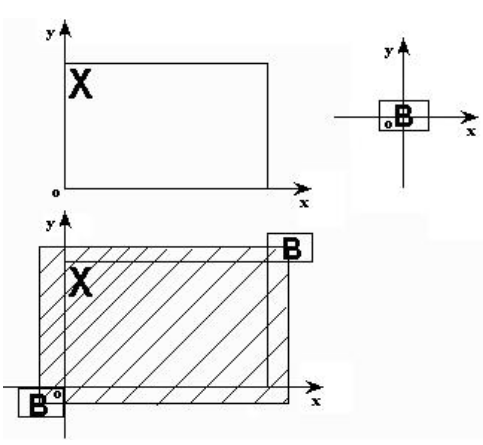

#### 2.6.3 开运算和闭运算
**开运算**

开运算= 先腐蚀运算，再膨胀运算（看上去把细微连在一起的两块目标分开了），开运算的效果图如下图所示：

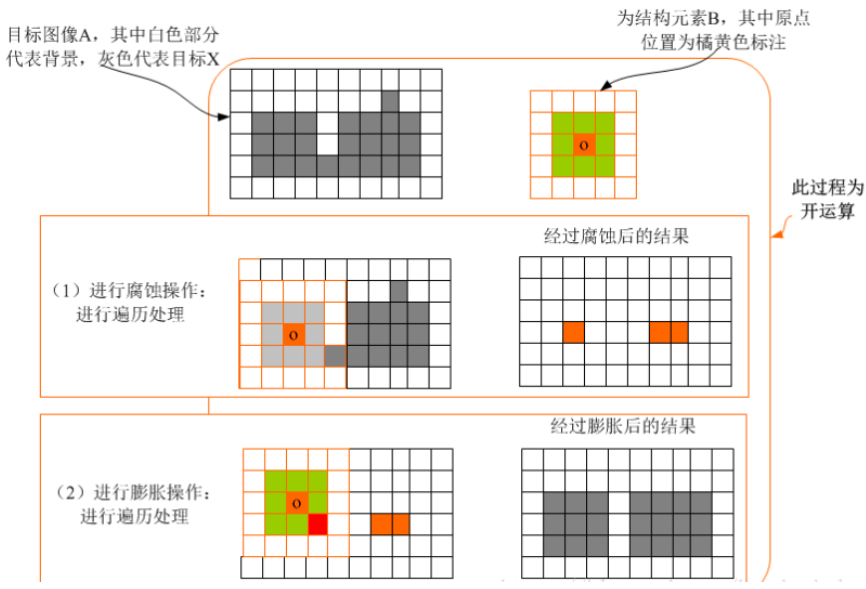

**开运算总结**

- 开运算能够除去孤立的小点，毛刺和小桥，而总的位置和形状不变。
- 开运算是一个基于几何运算的滤波器。
- 结构元素大小的不同将导致滤波效果的不同。
- 不同的结构元素的选择导致了不同的分割，即提取出不同的特征。

**闭运算**

闭运算 = 先膨胀运算，再腐蚀运算（看上去将两个细微连接的图块封闭在一起），闭运算的效果图如图所示：

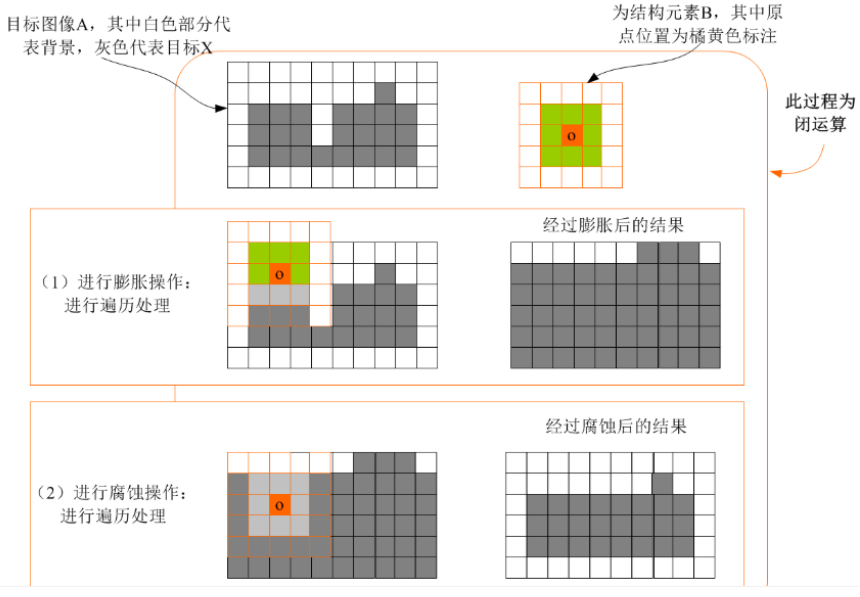

**闭运算总结**

- 闭运算能够填平小湖（即小孔），弥合小裂缝，而总的位置和形状不变。
- 闭运算是通过填充图像的凹角来滤波图像的。
- 结构元素大小的不同将导致滤波效果的不同。
- 不同结构元素的选择导致了不同的分割。

#### 2.6.4 形态学梯度
**形态学梯度（Gradient）**

- 基础梯度：基础梯度是用膨胀后的图像减去腐蚀后的图像得到差值图像，也是opencv中支持的计算形态学梯度的方法，而此方法得到梯度有称为基本梯度。
- 内部梯度：是用原图像减去腐蚀之后的图像得到差值图像，称为图像的内部梯度。
- 外部梯度：图像膨胀之后再减去原来的图像得到的差值图像，称为图像的外部梯度。

#### 2.6.5 顶帽和黑帽
- 顶帽（Top Hat）：
    - 原图像与开运算图的区别（差值），突出原图像中比周围亮的区域
- 黑帽（Black Hat）：
    - 闭操作图像 - 原图像,突出原图像中比周围暗的区域